Before Start, remember to check the path for dataset and location of utils.py

In [ ]:
import importlib
import utils
import scanpy as sc
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score
import numpy as np
import pandas as pd
from sklearn.metrics import precision_recall_curve, auc
import phate

import warnings
warnings.filterwarnings("ignore")



from utils import Gaussian_Mixture_Representation
from utils import Extract_Info
from utils import calculate_qot
from utils import visualize_and_evaluate
from utils import normalize_matrix
from utils import perform_analysis_phate_and_calculate_aucpr

Reading Annotated data

In [5]:
file_path = 'QOT/Dataset/Kidney_IgAN_T.h5ad'
adata=sc.read_h5ad(file_path)

Extract Dataframe from Annotated Data

In [6]:
Extract_Info(adata,  gene_matrix= adata.X, type_cell = 'Cell_type',id= 'sampleID', progession='status')

In [7]:
adata

AnnData object with n_obs × n_vars = 64493 × 3
    obs: 'Cell_type', 'sampleID', 'status', 'sex', 'Age'
    uns: 'Datafame_for_use'

Obtain the Gaussian Mixture Representation of the Gene Matrix

In [53]:
Gaussian_Mixture_Representation(adata, num_components=3, random_state=2)

Generate the sample level distance matrix by QOT method

In [54]:
calculate_qot(adata,method = "alternative")
print("QOT Complete")

Calculating GW2 distance 1/200661: VALIGA_mhnhhiaij6 to VALIGA_qtsqcpp0kw
Calculating GW2 distance 2/200661: VALIGA_mhnhhiaij6 to VALIGA_kxn47jtsj7
Calculating GW2 distance 3/200661: VALIGA_mhnhhiaij6 to VALIGA_v7wihwogxd
Calculating GW2 distance 4/200661: VALIGA_mhnhhiaij6 to VALIGA_6rfptyt3la
Calculating GW2 distance 5/200661: VALIGA_mhnhhiaij6 to VALIGA_ptx0nq0je1
Calculating GW2 distance 6/200661: VALIGA_mhnhhiaij6 to VALIGA_5wsdox7vv8
Calculating GW2 distance 7/200661: VALIGA_mhnhhiaij6 to VALIGA_gsn7dsolq3
Calculating GW2 distance 8/200661: VALIGA_mhnhhiaij6 to VALIGA_go0idujzww
Calculating GW2 distance 9/200661: VALIGA_mhnhhiaij6 to VALIGA_t3zeiu1pyk
Calculating GW2 distance 10/200661: VALIGA_mhnhhiaij6 to VALIGA_yslqk2ar7l
Calculating GW2 distance 11/200661: VALIGA_mhnhhiaij6 to VALIGA_6zlfjh7qh9
Calculating GW2 distance 12/200661: VALIGA_mhnhhiaij6 to VALIGA_j4oqgewzug
Calculating GW2 distance 13/200661: VALIGA_mhnhhiaij6 to VALIGA_nck6piqxlt
Calculating GW2 distance 14/200661

Evaluation of the Distance Matrix Based on Silhoutte Score; Silhoutte Score (PILOT version); ARI (Adjusted Rand Index)

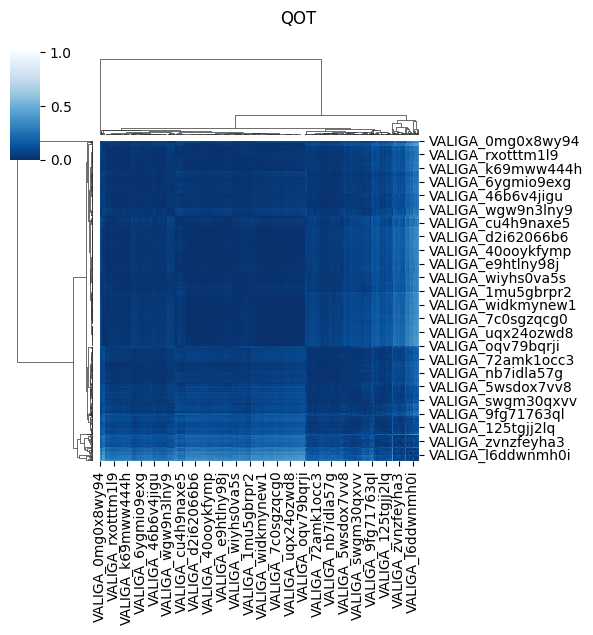

Silhouette Score: 0.1554896029911562
Silhouette Score (PILOT Version): 0.1302744166025131


In [57]:
visualize_and_evaluate(adata)

Downstream Analysis: Trajectory Estimation using PHATE

Calculating PHATE...
  Running PHATE on precomputed distance matrix with 634 observations.
  Calculating graph and diffusion operator...
    Calculating affinities...
  Calculated graph and diffusion operator in 0.01 seconds.
  Calculating optimal t...
    Automatically selected t = 11
  Calculated optimal t in 0.24 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.05 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 0.18 seconds.
Calculated PHATE in 0.48 seconds.


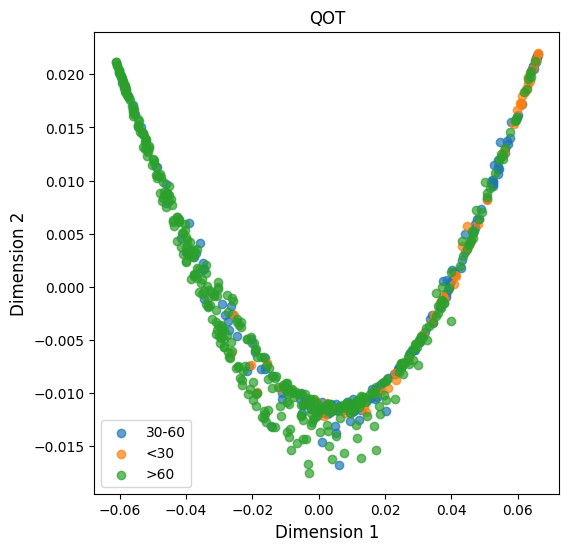

AUCPR: 0.5607664545794792


In [58]:
perform_analysis_phate_and_calculate_aucpr(adata,knn_number=80,dataset_name = 'KID_T')